In [55]:
pip install networkx plotly numpy


Note: you may need to restart the kernel to use updated packages.


In [18]:
pip install pythreejs networkx



  Obtaining dependency information for pythreejs from https://files.pythonhosted.org/packages/d8/8b/e2bbeb42068f0c48899e8eddd34902afc0f7429d4d2a152d2dc2670dc661/pythreejs-2.4.2-py3-none-any.whl.metadata
  Obtaining dependency information for ipydatawidgets>=1.1.1 from https://files.pythonhosted.org/packages/f1/5b/e63c877c4c94382b66de5045e08ec8cd960e8a4d22f0d62a4dfb1f9e5ac6/ipydatawidgets-4.3.5-py2.py3-none-any.whl.metadata
  Obtaining dependency information for traittypes>=0.2.0 from https://files.pythonhosted.org/packages/9c/d1/8d5bd662703cc1764d986f6908a608777305946fa634d34c470cd4a1e729/traittypes-0.2.1-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/3.4 MB ? eta -:--:--
   ---------------------------------------- 0.0/3.4 MB ? eta -:--:--
   ---------------------------------------- 0.0/3.4 MB 325.1 kB/s eta 0:00:11
    --------------------------------------- 0.1/3.4 MB 573.4 kB/s eta 0:00:06
   - -------------------------------------- 0.1/3.4 MB 595.3 k

In [6]:
# Install required libraries for 3D visualization (run this once)
# !pip install plotly networkx numpy matplotlib tqdm


# CrossRef & OpenCitation Example

In [45]:
# # Firstly, We show one example of extraction of dois with the help of CrossRef & OpenCitation.
# To show how these open research communities contributes to our project. 

In [2]:
import requests

def get_citation_data(doi):
    
    opencitations_url = f"https://opencitations.net/index/api/v1/citations/{doi}"
    crossref_url = f"https://api.crossref.org/works/{doi}"
    headers = {"Accept": "application/json"}

    try:
        opencitations_response = requests.get(opencitations_url)
        citing_papers_data = opencitations_response.json() if opencitations_response.status_code == 200 else None
    except requests.exceptions.RequestException as e:
        print(f"Error fetching citing papers: {e}")
        citing_papers_data = None

    try:
        crossref_response = requests.get(crossref_url, headers=headers)
        crossref_data = crossref_response.json() if crossref_response.status_code == 200 else None
        cited_papers_data = crossref_data["message"].get("reference", []) if crossref_data and "message" in crossref_data else None
    except requests.exceptions.RequestException as e:
        print(f"Error fetching cited papers: {e}")
        cited_papers_data = None

    citing_papers = [item.get('citing') for item in citing_papers_data] if citing_papers_data else None
    cited_papers = [ref.get('DOI', 'Unknown') for ref in cited_papers_data] if cited_papers_data else None

    return citing_papers, cited_papers

# Example usage:
doi_to_check = "10.1109/ACCESS.2020.2988796"
citing, cited = get_citation_data(doi_to_check)

print(f"For DOI: {doi_to_check}")
if citing:
    print("\nFirst 5 citing papers:")
    for i, citing_doi in enumerate(citing[:5]):
        print(f"{i+1}. {citing_doi}")
else:
    print("\nCould not retrieve citing papers.")

if cited:
    print("\nFirst 5 cited papers:")
    for i, cited_doi in enumerate(cited[:5]):
        print(f"{i+1}. {cited_doi}")
else:
    print("\nCould not retrieve cited papers.")

For DOI: 10.1109/ACCESS.2020.2988796

First 5 citing papers:
1. 10.1109/tdei.2023.3302816
2. 10.1109/ikt62039.2023.10433030
3. 10.1080/19476337.2024.2324024
4. 10.1145/3689210
5. 10.1109/tkde.2023.3342209

First 5 cited papers:
1. 10.1016/j.patcog.2017.05.017
2. 10.1109/34.990138
3. 10.1016/j.patcog.2012.04.031
4. 10.1126/science.1242072
5. Unknown


# *DATA COLLECTION*

In [5]:
# # # We used the sortgs tool (in cmd prompt) — a Python-based automated scraper for Google Scholar — 
# # to collect papers based on nine different keyword searches. 

# # The keywords such as adaptive_k-means_with_fuzzy_logic, dominant_color_quantization_using_fuzzy_clustering, 
# # fuzzy_clustering_in_image_segmentation, fuzzy_c-means_vs._k-means_in_color_clustering, 
# # fuzzy_color_clustering_in_image_processing, fuzzy_k-means_for_dominant_color_extraction, 
# # fuzzy_rule-based_color_segmentation, hybrid_fuzzy_k-means_for_color_feature_extraction, 
# # soft_clustering_for_dominant_color_extraction were chosen specifically very related to each other 
# # for obtaining clearer and more related graph of papers. 

# The main built-in code for the given data craping process 
# # sortgs "machine learning" --startyear 2000 --endyear 2025 was used to restrict the size of the data 
# # by filtering based on the specific year range. 

# # # Each search collected exactly 100 entities in 9 different csv files, resulting in a dataset of 900 entries. 


In [ ]:
# After having 9 different csv files ready we used OpenCitations and CrossRef for each paper to extract the following:
# # # # •	DOI (Digital Object Identifier) in 9 according different updated csv files.
# # # # •	List of papers citing it (Cited_By) in 9 according different json files.
# # # # We also cross-checked missing citation data through sources like OpenCitations and CrossRef where needed.

In [ ]:
# HERE

In [7]:
# # # We run the below code for all 9 keywords that were mentioned above.
# # # # # # # •	To extract the DOI (Digital Object Identifier) for each paper to be able to use CrossRef & OpenCitation.
# # We did this in 9 csv files and obtained the updated csv file that contains DOIs per paper inside.

In [8]:
#  So the below code actually was run 9 times with different file_paths.

In [14]:
import pandas as pd
import requests
import time

# Load the CSV file
file_path = "C:\\Users\\HP\\OneDrive - ADA University\\Documents\\ADA University\\!!Spring2025\\Data Mining 20294\\project_data\\data\\Soft_clustering_for_dominant_color_extraction.csv"  # Change to your actual file name
df = pd.read_csv(file_path)

# Function to get DOI from CrossRef
def get_doi(title):
    url = f"https://api.crossref.org/works?query.title={title}&rows=1"
    headers = {"User-Agent": "DOI Lookup Script"}
    
    try:
        response = requests.get(url, headers=headers)
        response.raise_for_status()
        data = response.json()
        if "message" in data and "items" in data["message"] and data["message"]["items"]:
            return data["message"]["items"][0].get("DOI", "Not Found")
    except requests.exceptions.RequestException as e:
        print(f"Error fetching DOI for '{title}': {e}")
    return "Not Found"

# Apply DOI lookup for each title
df["DOI"] = df["Title"].apply(lambda x: get_doi(str(x)) if pd.notna(x) else "Not Found")

# Save the updated CSV
output_file = "soft_updated_file.csv"
df.to_csv(output_file, index=False)

print(f"Updated file saved as {output_file}")


Updated file saved as soft_updated_file.csv


In [ ]:
# # After extracting the updated csv files with DOIs per paper we used CrossRef & OpenCitation 
# # to get the list of the papers that cite the given specific paper in the csv file as 9 different json files.

# Strategy that was used as follows:
#     For both CrossRef & OpenCitation we run the code to see which research community has extensive amount list of papers. 
#     The project continues with the maximum number of citations per paper to achieve more precise outputs. 

In [16]:
import pandas as pd
import requests
import time
import json
from tqdm import tqdm

def get_citations(doi):
    """Fetch citations (papers citing the given DOI) from OpenCitations API."""
    url = f"https://opencitations.net/index/api/v1/citations/{doi}"
    headers = {"User-Agent": "YourEmail@example.com"}  # Replace with your actual email

    try:
        response = requests.get(url, headers=headers, timeout=10)
        response.raise_for_status()
        data = response.json()

        citing_dois = [entry["citing"] for entry in data if "citing" in entry]
        return citing_dois if citing_dois else ["No Citations"]
    except requests.exceptions.RequestException as e:
        print(f"Error fetching citations for {doi}: {e}")
        return ["Error"]

# Load CSV file
input_file = "C:\\Users\\HP\\OneDrive - ADA University\\Documents\\ADA University\\!!Spring2025\\Data Mining 20294\\project_data\\data\\soft_updated_file.csv"  # Replace with your file name
df = pd.read_csv(input_file)

# Ensure DOI column exists
if "DOI" not in df.columns:
    raise ValueError("DOI column not found in CSV file!")

# Fetch citation data for each DOI
df["Cited_By"] = df["DOI"].apply(lambda doi: get_citations(str(doi)) if pd.notna(doi) else [])

# Save the updated CSV
df.to_csv("citations_updated.csv", index=False)

# Save citation data separately in JSON format (for graph analysis)
citation_data = df[["DOI", "Cited_By"]].to_dict(orient="records")
with open("soft_citation_data.json", "w") as json_file:
    json.dump(citation_data, json_file, indent=4)

print("Citation data saved to 'citations_updated.csv' and 'citation_data.json'.")


Error fetching citations for 10.1140/epjc/s10052-012-2225-5: HTTPSConnectionPool(host='opencitations.net', port=443): Read timed out. (read timeout=10)
Citation data saved to 'citations_updated.csv' and 'citation_data.json'.


In [17]:
import pandas as pd
import requests
import time
import json
from tqdm import tqdm

def get_crossref_citations(doi):
    """Fetch citations (papers citing the given DOI) from CrossRef API."""
    url = f"https://api.crossref.org/works/{doi}"
    headers = {"User-Agent": "YourEmail@example.com"}  # Replace with your actual email

    try:
        response = requests.get(url, headers=headers, timeout=10)
        response.raise_for_status()
        data = response.json()

        if "message" in data and "reference" in data["message"]:
            citing_dois = [
                ref["DOI"] for ref in data["message"]["reference"] if "DOI" in ref
            ]
            return citing_dois if citing_dois else ["No Citations"]
    except requests.exceptions.RequestException as e:
        print(f"Error fetching citations for {doi}: {e}")
    
    return ["Not Found"]

# Load CSV file
input_file = "C:\\Users\\HP\\OneDrive - ADA University\\Documents\\ADA University\\!!Spring2025\\Data Mining 20294\\project_data\\data\\soft_updated_file.csv"  # Replace with your file name
df = pd.read_csv(input_file)

# Ensure DOI column exists
if "DOI" not in df.columns:
    raise ValueError("DOI column not found in CSV file!")

# Fetch citation data for each DOI
df["Cited_By"] = df["DOI"].apply(lambda doi: get_crossref_citations(str(doi)) if pd.notna(doi) else [])

# Save the updated CSV
df.to_csv("citations_updated.csv", index=False)

# Save citation data separately in JSON format (for graph analysis)
citation_data = df[["DOI", "Cited_By"]].to_dict(orient="records")
with open("soft_cf_citation_data.json", "w") as json_file:
    json.dump(citation_data, json_file, indent=4)

print("Citation data saved to 'citations_updated.csv' and 'citation_data.json'.")


Citation data saved to 'citations_updated.csv' and 'citation_data.json'.


# EDA & PREPROCESSING 

In [ ]:
# # General overview of the data obtained
# Some EDA steps and Visuals 


🔍 Basic Info:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 900 entries, 0 to 899
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Rank            900 non-null    int64 
 1   Author          900 non-null    object
 2   Title           900 non-null    object
 3   Citations       900 non-null    int64 
 4   Year            900 non-null    int64 
 5   Publisher       900 non-null    object
 6   Venue           879 non-null    object
 7   Source          900 non-null    object
 8   cit/year        900 non-null    int64 
 9   DOI             900 non-null    object
 10  Citation_Count  900 non-null    int32 
dtypes: int32(1), int64(4), object(6)
memory usage: 80.9+ KB
None

📊 Descriptive Statistics:
             Rank                                 Author  \
count   900.00000                                    900   
unique        NaN                                    721   
top           NaN  T Lei, X Jia, Y 

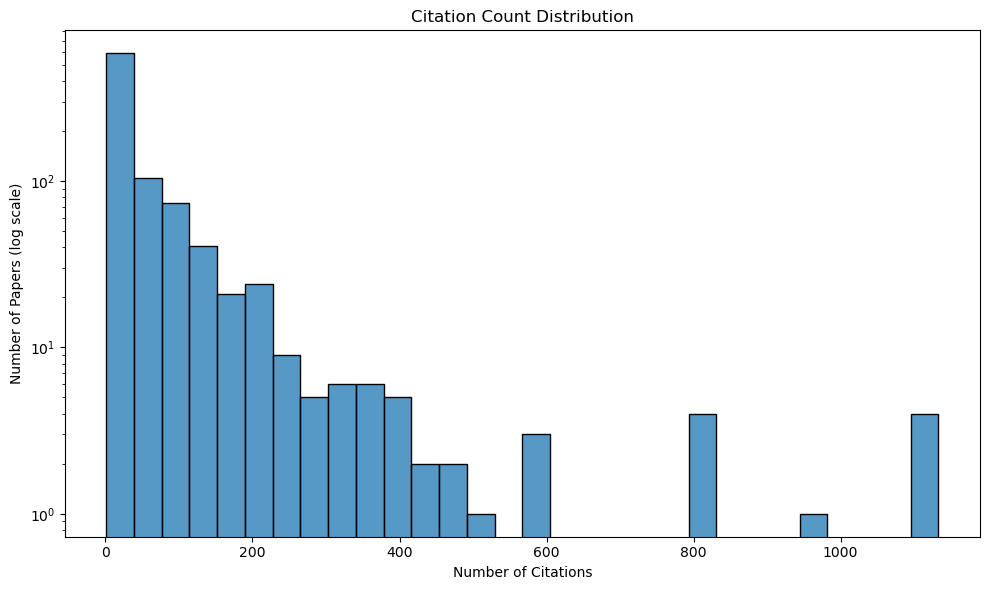


🏆 Top 10 Most Cited Papers:
                                                 Title  \
801  A survey of content-based image retrieval with...   
800   Color image segmentation: advances and prospects   
400   Color image segmentation: advances and prospects   
200   Color image segmentation: advances and prospects   
401  Blobworld: Image segmentation using expectatio...   
803  A robust fuzzy local information C-means clust...   
405  A robust fuzzy local information C-means clust...   
500  A robust fuzzy local information C-means clust...   
300  A robust fuzzy local information C-means clust...   
203  Image segmentation using K-means clustering al...   

                                  Author  Citation_Count  Year  \
801          Y Liu, D Zhang, G Lu, WY Ma            1133  2007   
800    HD Cheng, XH Jiang, Y Sun, J Wang            1130  2001   
400    HD Cheng, XH Jiang, Y Sun, J Wang            1130  2001   
200    HD Cheng, XH Jiang, Y Sun, J Wang            1130  2001   
40

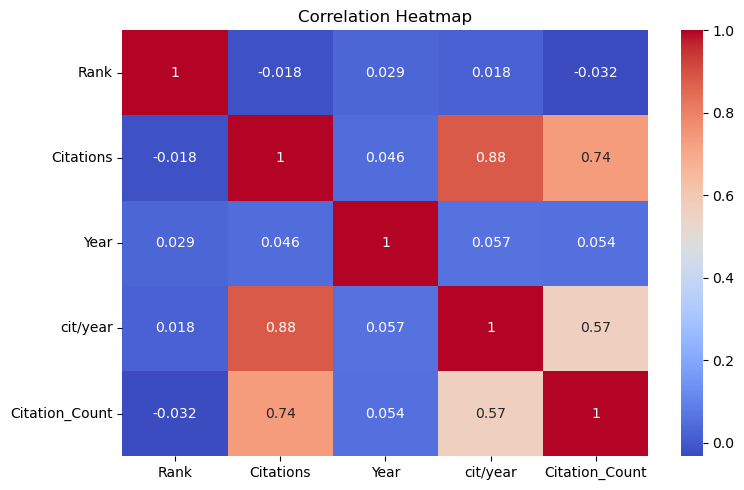

In [3]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set paths
csv_folder_path = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\csvs"
json_folder_path = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\citations"

# Load all CSV files into one DataFrame
csv_files = [f for f in os.listdir(csv_folder_path) if f.endswith('.csv')]
all_papers_df = pd.DataFrame()

for file in csv_files:
    file_path = os.path.join(csv_folder_path, file)
    df = pd.read_csv(file_path)
    all_papers_df = pd.concat([all_papers_df, df], ignore_index=True)

# Standardize DOI column
all_papers_df['DOI'] = all_papers_df['DOI'].str.lower().str.strip()

# Load citation data from all JSON files
citation_data = {}
for file in os.listdir(json_folder_path):
    if file.endswith('.json'):
        with open(os.path.join(json_folder_path, file), 'r', encoding='utf-8') as f:
            data = json.load(f)
            for entry in data:
                doi = entry.get("DOI", "").lower().strip()
                cited_by = entry.get("Cited_By", [])
                citation_data[doi] = cited_by if isinstance(cited_by, list) else []

# Create DataFrame from citation data
citation_df = pd.DataFrame([
    {'DOI': doi, 'Citation_Count': len(cited_by)}
    for doi, cited_by in citation_data.items()
])

# Merge the paper metadata with citation counts
merged_df = pd.merge(all_papers_df, citation_df, on='DOI', how='left')
merged_df['Citation_Count'] = merged_df['Citation_Count'].fillna(0).astype(int)

# ------------------- EDA -------------------

print("\n🔍 Basic Info:")
print(merged_df.info())

print("\n📊 Descriptive Statistics:")
print(merged_df.describe(include='all'))

# Check for missing values
print("\n❗ Missing Values:")
print(merged_df.isnull().sum())

# Distribution of Citations
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Citation_Count'], bins=30)
plt.yscale('log')  # Log scale for better visualization
plt.title('Citation Count Distribution')
plt.xlabel('Number of Citations')
plt.ylabel('Number of Papers (log scale)')
plt.tight_layout()
plt.show()

# Top 10 most cited papers
top_cited = merged_df.sort_values(by='Citation_Count', ascending=False).head(10)
print("\n🏆 Top 10 Most Cited Papers:")
print(top_cited[['Title', 'Author', 'Citation_Count', 'Year', 'DOI']])

# Correlation heatmap (if numeric fields exist)
numeric_cols = merged_df.select_dtypes(include='number')
if not numeric_cols.empty:
    plt.figure(figsize=(8, 5))
    sns.heatmap(numeric_cols.corr(), annot=True, cmap='coolwarm')
    plt.title('Correlation Heatmap')
    plt.tight_layout()
    plt.show()


In [42]:
import json
import os
import networkx as nx
import matplotlib.pyplot as plt

# Folder where your 9 JSON files are stored (change if needed)
json_folder = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\citations"

# Check if folder exists
if not os.path.exists(json_folder):
    print(f"Error: Folder not found -> {json_folder}")
    exit()

# Create a directed graph
citation_graph = nx.DiGraph()

# Load all JSON files
for filename in os.listdir(json_folder):
    if filename.endswith(".json"):
        filepath = os.path.join(json_folder, filename)
        print(f"Processing file: {filename}")  # Debugging step

        try:
            with open(filepath, "r", encoding="utf-8") as file:
                data = json.load(file)

                # Process each paper's citation data
                for entry in data:
                    doi = entry.get("DOI")  # Use .get() to avoid errors
                    cited_by = entry.get("Cited_By", [])  # Default to empty list

                    if not doi:  # Skip invalid entries
                        continue

                    # Add DOI as a node
                    citation_graph.add_node(doi)

                    # Add edges (cited_by → DOI)
                    for citing_doi in cited_by:
                        citation_graph.add_edge(citing_doi, doi)

        except json.JSONDecodeError:
            print(f"Error reading {filename}: Invalid JSON format.")
        except Exception as e:
            print(f"Unexpected error processing {filename}: {e}")

# Print graph stats
print(f"Total nodes: {citation_graph.number_of_nodes()}")
print(f"Total edges: {citation_graph.number_of_edges()}")

# **Limit visualization if the graph is too big**
MAX_NODES = 20000  # Start with 200 for testing
if citation_graph.number_of_nodes() > MAX_NODES:
    print("Graph is too large! Showing only a subgraph of the top 300 nodes.")
    sampled_nodes = list(citation_graph.nodes())[:MAX_NODES]
    subgraph = citation_graph.subgraph(sampled_nodes)
else:
    subgraph = citation_graph

Processing file: adaptive_citation_data.json
Processing file: dominant_cf_citation_data.json
Processing file: fuzzy_clustering_citation_data.json
Processing file: fuzzy_cmeans_citation_data.json
Processing file: fuzzy_color_citation_data.json
Processing file: fuzzy_kmeans_citation_data.json
Processing file: fuzzy_rule_citation_data.json
Processing file: hybrid_cf_citation_data.json
Processing file: soft_citation_data.json
Total nodes: 32646
Total edges: 39869
Graph is too large! Showing only a subgraph of the top 300 nodes.


# Mining Techniques 


In [ ]:
# As we see from the output visualizing the 32646 nodes is not an easy job. 
# Therefore, we first get top strongly connected 1000 nodes in order to see the current graph representation. 

🔄 Loading JSON files and building graph...


Reading JSON: 100%|██████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 18.26it/s]


📊 Initial Graph: 32631 nodes, 39826 edges
🔍 Removed 0 isolated nodes.
✅ Filtered Graph: 1000 nodes, 3257 edges

🎨 Visualizing graph...


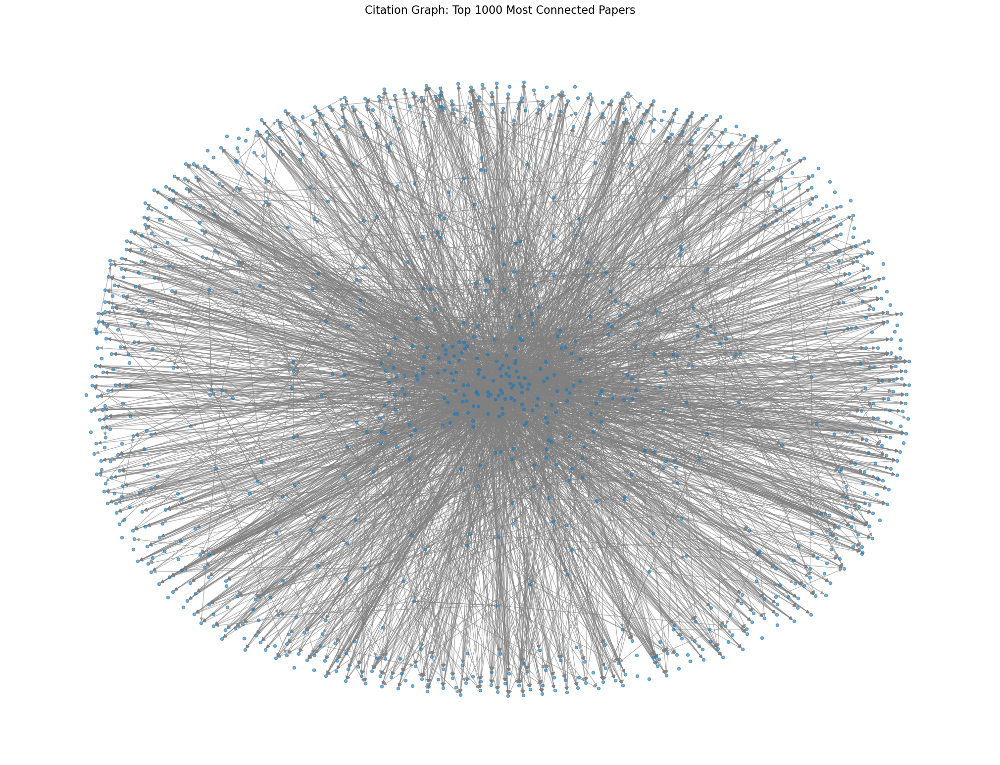

In [8]:
import os
import json
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm

# === Step 1: Load and Filter Graph ===
def load_filtered_graph(json_folder, top_n=1000):
    """Load graph from JSON files and keep only top N connected non-isolated nodes."""
    G = nx.DiGraph()
    print("🔄 Loading JSON files and building graph...")

    for file_name in tqdm(os.listdir(json_folder), desc="Reading JSON"):
        if file_name.endswith('.json'):
            file_path = os.path.join(json_folder, file_name)
            with open(file_path, 'r', encoding='utf-8') as f:
                try:
                    data = json.load(f)
                    for entry in data:
                        source_doi = entry.get("DOI")
                        citations = entry.get("Cited_By", [])
                        if source_doi and isinstance(citations, list):
                            for target_doi in citations:
                                if target_doi and target_doi != "Not Found":
                                    G.add_edge(source_doi, target_doi)
                except json.JSONDecodeError:
                    print(f"❌ JSON decode error in file: {file_name}")

    print(f"📊 Initial Graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # Remove isolated nodes
    isolates = list(nx.isolates(G))
    G.remove_nodes_from(isolates)
    print(f"🔍 Removed {len(isolates)} isolated nodes.")

    # Select top N most connected nodes by degree
    degree_sorted = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nodes = [node for node, _ in degree_sorted]
    G_top = G.subgraph(top_nodes).copy()

    print(f"✅ Filtered Graph: {G_top.number_of_nodes()} nodes, {G_top.number_of_edges()} edges")
    return G_top

# === Step 2: Visualize Graph ===
def visualize_graph(G):
    print("\n🎨 Visualizing graph...")
    plt.figure(figsize=(20, 15))
    pos = nx.spring_layout(G, seed=42, k=0.15)  # You can adjust k for more/less spread
    nx.draw(
        G, pos,
        node_size=20,
        edge_color="gray",
        alpha=0.6,
        arrows=True,
        with_labels=False
    )
    plt.title("Citation Graph: Top 1000 Most Connected Papers", fontsize=16)
    plt.show()

# === Main Execution ===
if __name__ == "__main__":
    json_folder = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\citations"

    # Step 1: Load and filter graph
    G_filtered = load_filtered_graph(json_folder, top_n=1000)

    # Step 2: Visualize graph
    if G_filtered.number_of_nodes() > 0:
        visualize_graph(G_filtered)
    else:
        print("❌ No data to visualize.")


In [ ]:
# For better visualizing we give it with 3D Graph

# # > **⚠️ Important Note for 3D Visuals:**


In [3]:
# # 1. **After reopening the notebook, please rerun the code** (especially the visualization cell)!
# # 2. The **3D / spring layout visualizations in Jupyter** are volatile — they do not persist after saving or reopening.
# # 3. **Simply rerun the necessary cells** (including the graph creation and visualization) to regenerate the graph.

# # Required Installations (if not already installed):
# # ```bash
#  pip install networkx matplotlib tqdm
#  pip install plotly
#  ```

# # - `networkx` — for building and analyzing graphs  
# # - `matplotlib` — for graph visualization  
# # - `tqdm` — for displaying progress bars while reading JSON files  
# # - `plotly` — required for interactive 3D graph rendering

In [13]:
# #  **Important!**
# # - **Make sure to first run the code that generates the filtered graph** (`G_filtered`), as this is required for visualization.
# #  (That is above )

# # - **Verify the path to the folder containing your JSON files** (usually named "citations"). Make sure all your JSON files are in this folder for proper graph loading and visualization.

In [14]:
# **If you still encounter issues** with the 3D plot visualizations:
# - Please **refer to the PowerPoint** (PPT) presentation.
# - You can **watch the video** provided in the PPT to see a walkthrough of visualizing the 3D plots.

In [9]:
import plotly.graph_objects as go
import numpy as np

# === 3D Visualization of the real filtered graph ===

# Make sure G_filtered exists
if G_filtered.number_of_nodes() == 0:
    print("❌ No nodes to visualize.")
else:
    # 3D layout for nodes
    pos = nx.spring_layout(G_filtered, dim=3, seed=42)

    # Coordinates and hover text
    node_x = []
    node_y = []
    node_z = []
    hover_texts = []

    for node in G_filtered.nodes():
        x, y, z = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_z.append(z)
        hover_texts.append(f"Node: {node}<br>x: {x:.3f}<br>y: {y:.3f}<br>z: {z:.3f}")

    # Edge coordinates
    edge_x = []
    edge_y = []
    edge_z = []

    for edge in G_filtered.edges():
        x0, y0, z0 = pos[edge[0]]
        x1, y1, z1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_z.extend([z0, z1, None])

    # Create edge trace
    edge_trace = go.Scatter3d(
        x=edge_x,
        y=edge_y,
        z=edge_z,
        mode='lines',
        line=dict(color='lightgray', width=1),
        hoverinfo='none'  # No hover for edges
    )

    # Create node trace
    node_trace = go.Scatter3d(
        x=node_x,
        y=node_y,
        z=node_z,
        mode='markers',
        marker=dict(
            size=5,
            color='royalblue',
            opacity=0.8,
            line=dict(color='darkblue', width=0.5)
        ),
        hoverinfo='text',
        text=hover_texts,  # Hover text showing node + coordinates
    )

    # Create figure
    fig = go.Figure(data=[edge_trace, node_trace])

    # Update layout
    fig.update_layout(
        title='📚 3D Citation Graph Visualization (Top 1000 Nodes)',
        title_x=0.5,
        title_font=dict(family="Arial", size=22, color="navy"),
        showlegend=False,
        scene=dict(
            xaxis=dict(showgrid=False, zeroline=False, showbackground=False),
            yaxis=dict(showgrid=False, zeroline=False, showbackground=False),
            zaxis=dict(showgrid=False, zeroline=False, showbackground=False),
            aspectmode='cube',
            camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))
        ),
        margin=dict(l=0, r=0, b=0, t=50),
        plot_bgcolor='white'
    )

    fig.show()


In [3]:
# To achieve more visible graph we reduce the node size to 300. 
# The main purpose is to compute the important graph statistics easily. 

📂 Loading graph data...


Loading JSON files: 100%|████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 30.23it/s]


✅ Graph loaded and filtered: 300 nodes, 966 edges


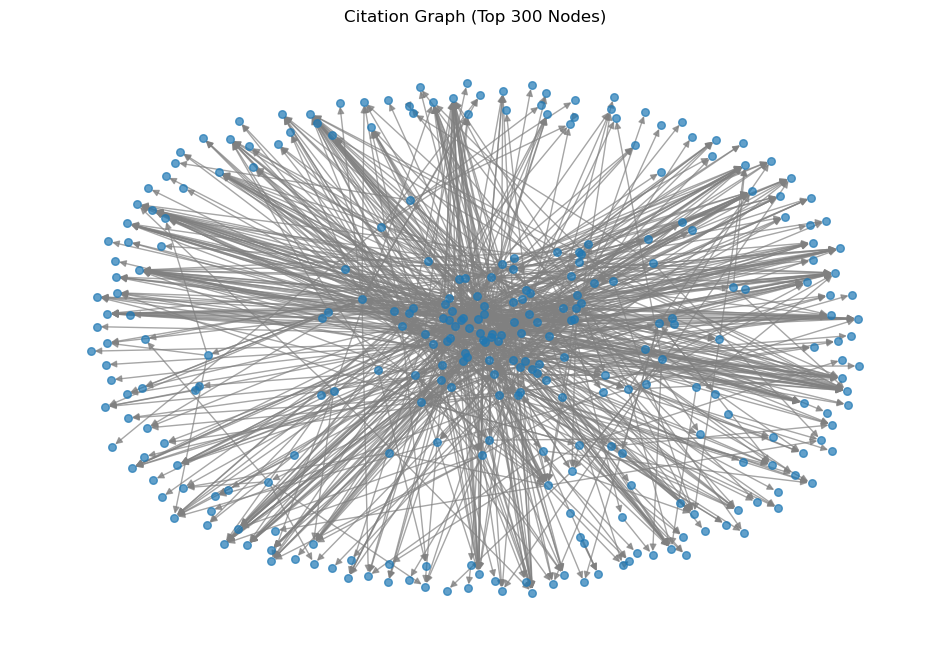

In [1]:
import os
import json
import networkx as nx
from tqdm import tqdm
import matplotlib.pyplot as plt

def load_filtered_graph(json_folder, top_n=300):
    """Load citation graph from JSON and return top N most connected nodes with at least 1 edge."""
    G = nx.DiGraph()

    print("📂 Loading graph data...")
    for file_name in tqdm(os.listdir(json_folder), desc="Loading JSON files"):
        if file_name.endswith(".json"):
            file_path = os.path.join(json_folder, file_name)
            with open(file_path, "r", encoding="utf-8") as f:
                try:
                    data = json.load(f)
                    for entry in data:
                        source_doi = entry.get("DOI")
                        citations = entry.get("Cited_By", [])
                        # Ensure source_doi exists and citations is a valid list
                        if source_doi and isinstance(citations, list):
                            for target_doi in citations:
                                if target_doi != "Not Found":  # Avoid invalid citation entries
                                    G.add_edge(source_doi, target_doi)
                except json.JSONDecodeError:
                    print(f"❌ Error decoding JSON in file: {file_name}")

    # Remove isolated nodes (nodes with no edges)
    G.remove_nodes_from([node for node in G.nodes if G.degree(node) == 0])

    # Sort nodes by degree (most connected first)
    top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)

    # Select nodes that form a weakly connected subgraph
    selected_nodes = set()
    for node, _ in top_nodes:
        temp_nodes = selected_nodes | {node}
        temp_subgraph = G.subgraph(temp_nodes).copy()

        # Convert copied DiGraph to undirected before checking connectivity
        if nx.is_connected(temp_subgraph.to_undirected()):
            selected_nodes.add(node)
        if len(selected_nodes) >= top_n:
            break

    # Create a subgraph of the selected nodes
    G_filtered = G.subgraph(selected_nodes).copy()
    print(f"✅ Graph loaded and filtered: {G_filtered.number_of_nodes()} nodes, {G_filtered.number_of_edges()} edges")

    return G_filtered

# Define the path to your JSON folder
json_folder = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\citations"

# Load and filter the graph
G_filtered = load_filtered_graph(json_folder, top_n=300)

# Visualize the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_filtered, seed=42)
nx.draw_networkx(G_filtered, pos, with_labels=False, node_size=30, edge_color='gray', alpha=0.7)
plt.title("Citation Graph (Top 300 Nodes)")
plt.axis("off")
plt.show()

In [ ]:
# Similarly we give it with 3D Graph.

In [2]:
import networkx as nx
import plotly.graph_objects as go
import numpy as np

# === 3D Visualization using G_filtered with 300 nodes ===

# Step 1: Limit to 300 nodes
if G_filtered.number_of_nodes() > 300:
    top_nodes = sorted(G_filtered.degree, key=lambda x: x[1], reverse=True)[:300]
    selected_nodes = [node for node, _ in top_nodes]
    G_sub = G_filtered.subgraph(selected_nodes).copy()
else:
    G_sub = G_filtered.copy()

# Step 2: Generate 3D layout
pos = nx.spring_layout(G_sub, dim=3, seed=42)

# Step 3: Prepare node coordinates and hover texts
node_x = []
node_y = []
node_z = []
hover_texts = []
node_colors = []

for node in G_sub.nodes():
    x, y, z = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(z)
    hover_texts.append(f"Node: {node}<br>x: {x:.3f}<br>y: {y:.3f}<br>z: {z:.3f}")
    node_colors.append(G_sub.degree(node))  # Color by node degree

# Step 4: Prepare edge coordinates
edge_x = []
edge_y = []
edge_z = []

for edge in G_sub.edges():
    x0, y0, z0 = pos[edge[0]]
    x1, y1, z1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_z.extend([z0, z1, None])

# Step 5: Create 3D scatter traces
node_trace = go.Scatter3d(
    x=node_x,
    y=node_y,
    z=node_z,
    mode='markers',
    marker=dict(
        showscale=True,
        colorscale='Viridis',
        reversescale=True,
        color=node_colors,
        size=6,
        colorbar=dict(thickness=15, title='Node Connections', xanchor='left', titleside='right')
    ),
    hoverinfo='text',
    text=hover_texts,
)

edge_trace = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    mode='lines',
    line=dict(width=0.5, color='gray'),
    hoverinfo='none'
)

# Step 6: Create and show figure
fig = go.Figure(data=[edge_trace, node_trace])

fig.update_layout(
    title='📚 3D Force-Directed Citation Graph (Top 300 nodes)',
    title_x=0.5,
    title_font=dict(family="Arial", size=22, color="navy"),
    showlegend=False,
    scene=dict(
        xaxis=dict(showgrid=False, zeroline=False, showbackground=False),
        yaxis=dict(showgrid=False, zeroline=False, showbackground=False),
        zaxis=dict(showgrid=False, zeroline=False, showbackground=False),
        aspectmode='cube'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    plot_bgcolor='white'
)

fig.show()


In [ ]:
# Now, we want the graph to communicate with the user from the nodes and relationships perspective. 
# For that we label the nodes in the graph with the paper ranks and make more meaningful insights on it. 

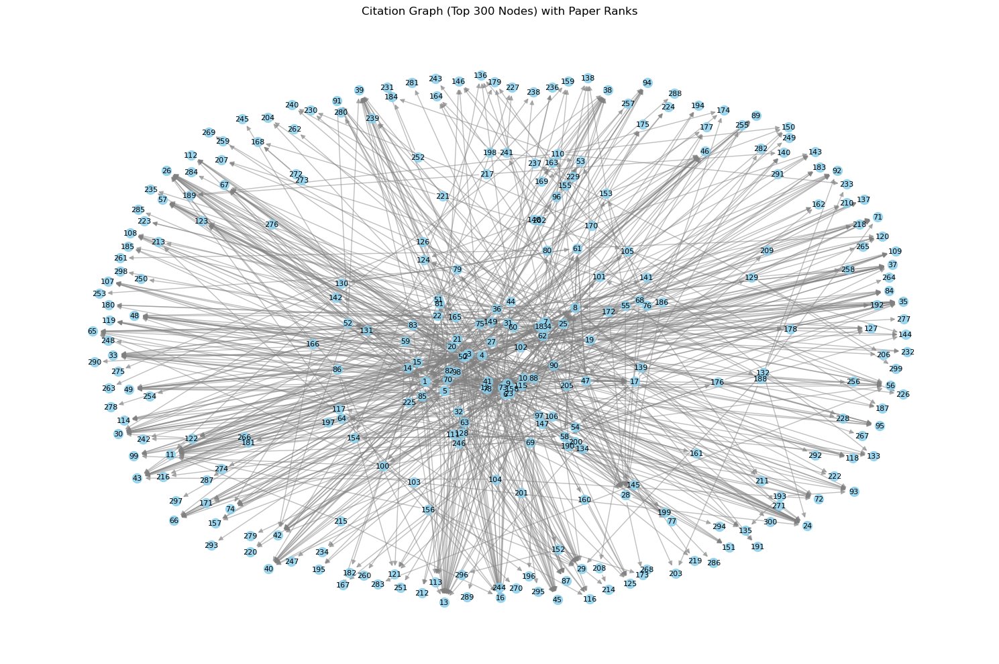

📄 Mapping of Ranks to Paper DOIs:
Rank 1: 10.1186/1687-6180-2011-118
Rank 2: 10.1007/s11554-012-0291-4
Rank 3: 10.1007/978-94-007-5389-1_5
Rank 4: 10.1007/s10489-018-1389-6
Rank 5: 10.1109/access.2019.2937934
Rank 6: 10.1016/j.patcog.2013.11.017
Rank 7: 10.1109/tip.2015.2456505
Rank 8: 10.1016/j.patcog.2010.07.013
Rank 9: 10.1007/s00500-019-04216-8
Rank 10: 10.1002/9781119551621.ch9
Rank 11: 10.1145/965145.801294
Rank 12: 10.1007/s00530-023-01206-7
Rank 13: 10.1016/S0031-3203(01)00170-4
Rank 14: 10.1007/s44196-023-00185-x
Rank 15: 10.1016/j.eswa.2022.117927
Rank 16: 10.1109/78.107417
Rank 17: 10.1016/j.patrec.2003.10.004
Rank 18: 10.1016/j.patcog.2009.11.015
Rank 19: 10.1007/s11704-010-0393-8
Rank 20: 10.1080/08839514.2016.1169049
Rank 21: 10.1016/j.patrec.2004.02.012
Rank 22: 10.1007/s00530-020-00682-5
Rank 23: 10.1016/j.eswa.2023.120666
Rank 24: 10.1002/col.5080150109
Rank 25: 10.1016/j.asoc.2015.01.039
Rank 26: 10.1109/TCOM.1980.1094577
Rank 27: 10.1016/j.eswa.2014.01.003
Rank 28: 1

In [12]:
import matplotlib.pyplot as plt
import networkx as nx

# Generate position layout
pos = nx.spring_layout(G_filtered, seed=42)

# Assign ranks to nodes (1 to N) based on their degree
ranked_nodes = sorted(G_filtered.degree, key=lambda x: x[1], reverse=True)
rank_labels = {}
doi_to_rank = {}

for idx, (node, _) in enumerate(ranked_nodes, start=1):
    rank_labels[node] = str(idx)  # This will be used as the label on the node
    doi_to_rank[idx] = node       # Save mapping of rank → DOI

# Draw the graph
plt.figure(figsize=(15, 10))
nx.draw_networkx_nodes(G_filtered, pos, node_size=100, node_color='skyblue', alpha=0.8)
nx.draw_networkx_edges(G_filtered, pos, edge_color='gray', alpha=0.5)
nx.draw_networkx_labels(G_filtered, pos, labels=rank_labels, font_size=8, font_color='black')

plt.title("Citation Graph (Top 300 Nodes) with Paper Ranks")
plt.axis("off")
plt.tight_layout()
plt.show()

# Optional: print mapping of ranks to paper DOIs
print("📄 Mapping of Ranks to Paper DOIs:")
for rank, doi in doi_to_rank.items():
    print(f"Rank {rank}: {doi}")


In [ ]:
# Again we are visualizing it with 3D Graph. 
# Now, nodes are delivering information on the graph. 

In [13]:
import networkx as nx
import numpy as np
import plotly.graph_objects as go

# 3D layout for positions
pos_3d = nx.spring_layout(G_filtered, dim=3, seed=42)

# Coordinates
node_xyz = np.array([pos_3d[v] for v in G_filtered.nodes()])
edge_xyz = [(pos_3d[u], pos_3d[v]) for u, v in G_filtered.edges()]

# Create ranking and mapping
ranked_nodes = sorted(G_filtered.degree, key=lambda x: x[1], reverse=True)
rank_labels = {node: str(rank) for rank, (node, _) in enumerate(ranked_nodes, 1)}
hover_texts = [f"DOI: {node}" for node in G_filtered.nodes()]

# Create node trace (just numeric ranks as labels)
node_trace = go.Scatter3d(
    x=node_xyz[:, 0],
    y=node_xyz[:, 1],
    z=node_xyz[:, 2],
    mode='markers+text',
    text=[rank_labels[node] for node in G_filtered.nodes()],
    hovertext=hover_texts,
    marker=dict(size=4, color='skyblue', opacity=0.8),
    textposition='top center',
    hoverinfo='text'
)

# Create edge traces
edge_trace = []
for src, dst in edge_xyz:
    edge_trace.append(
        go.Scatter3d(
            x=[src[0], dst[0], None],
            y=[src[1], dst[1], None],
            z=[src[2], dst[2], None],
            mode='lines',
            line=dict(color='gray', width=1),
            hoverinfo='none'
        )
    )

# Combine and plot
fig = go.Figure(data=edge_trace + [node_trace])
fig.update_layout(
    title='📈 3D Citation Graph (Top 300 Nodes)',
    showlegend=False,
    scene=dict(
        xaxis=dict(showbackground=False),
        yaxis=dict(showbackground=False),
        zaxis=dict(showbackground=False)
    ),
    margin=dict(l=0, r=0, b=0, t=40),
)

fig.show()


In [3]:
# Another example with 30 nodes

📂 Loading graph data...


Loading JSON files: 100%|████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00,  9.60it/s]


✅ Graph loaded and filtered: 30 nodes, 46 edges


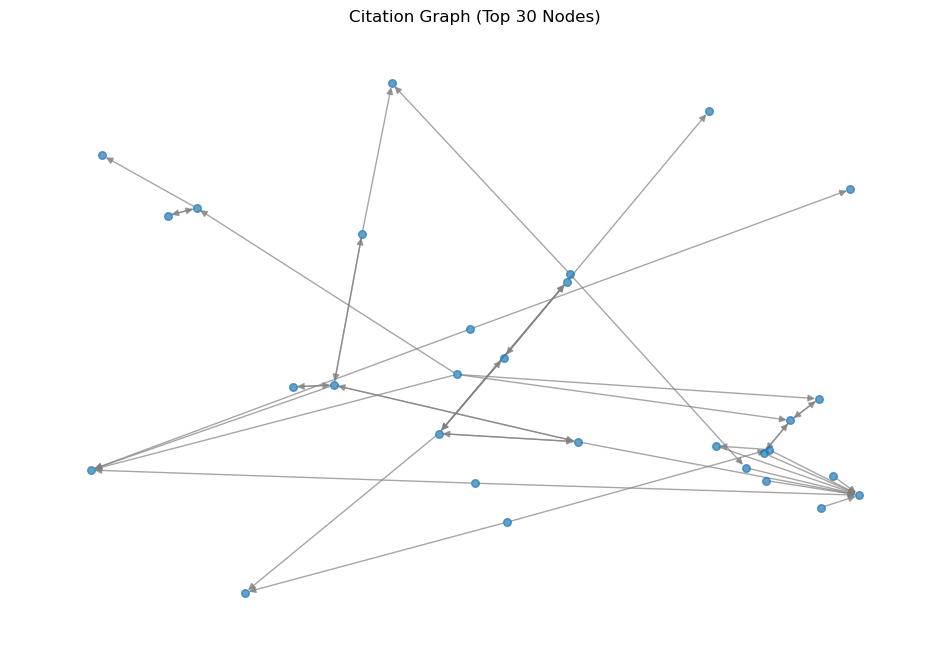

In [4]:
import os
import json
import networkx as nx
from tqdm import tqdm
import matplotlib.pyplot as plt

def load_filtered_graph(json_folder, top_n=300):
    """Load citation graph from JSON and return top N most connected nodes with at least 1 edge."""
    G = nx.DiGraph()

    print("📂 Loading graph data...")
    for file_name in tqdm(os.listdir(json_folder), desc="Loading JSON files"):
        if file_name.endswith(".json"):
            file_path = os.path.join(json_folder, file_name)
            with open(file_path, "r", encoding="utf-8") as f:
                try:
                    data = json.load(f)
                    for entry in data:
                        source_doi = entry.get("DOI")
                        citations = entry.get("Cited_By", [])
                        # Ensure source_doi exists and citations is a valid list
                        if source_doi and isinstance(citations, list):
                            for target_doi in citations:
                                if target_doi != "Not Found":  # Avoid invalid citation entries
                                    G.add_edge(source_doi, target_doi)
                except json.JSONDecodeError:
                    print(f"❌ Error decoding JSON in file: {file_name}")

    # Remove isolated nodes (nodes with no edges)
    G.remove_nodes_from([node for node in G.nodes if G.degree(node) == 0])

    # Sort nodes by degree (most connected first)
    top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)

    # Select nodes that form a weakly connected subgraph
    selected_nodes = set()
    for node, _ in top_nodes:
        temp_nodes = selected_nodes | {node}
        temp_subgraph = G.subgraph(temp_nodes).copy()

        # Convert copied DiGraph to undirected before checking connectivity
        if nx.is_connected(temp_subgraph.to_undirected()):
            selected_nodes.add(node)
        if len(selected_nodes) >= top_n:
            break

    # Create a subgraph of the selected nodes
    G_filtered = G.subgraph(selected_nodes).copy()
    print(f"✅ Graph loaded and filtered: {G_filtered.number_of_nodes()} nodes, {G_filtered.number_of_edges()} edges")

    return G_filtered

# Define the path to your JSON folder
json_folder = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\citations"

# Load and filter the graph
G_filtered = load_filtered_graph(json_folder, top_n=30)

# Visualize the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_filtered, seed=42)
nx.draw_networkx(G_filtered, pos, with_labels=False, node_size=30, edge_color='gray', alpha=0.7)
plt.title("Citation Graph (Top 30 Nodes)")
plt.axis("off")
plt.show()

In [5]:
import networkx as nx
import plotly.graph_objects as go
import numpy as np

# === 3D Visualization using G_filtered with 300 nodes ===

# Step 1: Limit to 300 nodes
if G_filtered.number_of_nodes() > 30:
    top_nodes = sorted(G_filtered.degree, key=lambda x: x[1], reverse=True)[:300]
    selected_nodes = [node for node, _ in top_nodes]
    G_sub = G_filtered.subgraph(selected_nodes).copy()
else:
    G_sub = G_filtered.copy()

# Step 2: Generate 3D layout
pos = nx.spring_layout(G_sub, dim=3, seed=42)

# Step 3: Prepare node coordinates and hover texts
node_x = []
node_y = []
node_z = []
hover_texts = []
node_colors = []

for node in G_sub.nodes():
    x, y, z = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(z)
    hover_texts.append(f"Node: {node}<br>x: {x:.3f}<br>y: {y:.3f}<br>z: {z:.3f}")
    node_colors.append(G_sub.degree(node))  # Color by node degree

# Step 4: Prepare edge coordinates
edge_x = []
edge_y = []
edge_z = []

for edge in G_sub.edges():
    x0, y0, z0 = pos[edge[0]]
    x1, y1, z1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_z.extend([z0, z1, None])

# Step 5: Create 3D scatter traces
node_trace = go.Scatter3d(
    x=node_x,
    y=node_y,
    z=node_z,
    mode='markers',
    marker=dict(
        showscale=True,
        colorscale='Viridis',
        reversescale=True,
        color=node_colors,
        size=6,
        colorbar=dict(thickness=15, title='Node Connections', xanchor='left', titleside='right')
    ),
    hoverinfo='text',
    text=hover_texts,
)

edge_trace = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    mode='lines',
    line=dict(width=0.5, color='gray'),
    hoverinfo='none'
)

# Step 6: Create and show figure
fig = go.Figure(data=[edge_trace, node_trace])

fig.update_layout(
    title='📚 3D Force-Directed Citation Graph (Top 30 nodes)',
    title_x=0.5,
    title_font=dict(family="Arial", size=22, color="navy"),
    showlegend=False,
    scene=dict(
        xaxis=dict(showgrid=False, zeroline=False, showbackground=False),
        yaxis=dict(showgrid=False, zeroline=False, showbackground=False),
        zaxis=dict(showgrid=False, zeroline=False, showbackground=False),
        aspectmode='cube'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    plot_bgcolor='white'
)

fig.show()


In [ ]:
# Graph Statistics on Different Metrics based on 300 nodes.

Read JSON files from a folder where each file contains citation records.
For each JSON entry, extracted the DOI of the paper and its list of citations.
Built a directed graph using NetworkX, adding edges from the source paper to each cited paper.
Removed isolated nodes (papers not connected to any others).
Sorted nodes by total degree and kept only the top 300 most connected nodes to form a subgraph for focused analysis.

Checked if the graph is strongly connected. If not, I extracted the largest strongly connected component.
On this component, computed:
Average Path Length,
Diameter,
Radius,

Also converted the graph to undirected and computed:
Average Clustering Coefficient
Global Efficiency

These metrics help quantify how tightly papers are interconnected in the citation network.


Calculated several centrality measures for each node:
Degree Centrality
Closeness Centrality
Betweenness Centrality
PageRank
In-Degree Centrality 
Eccentricity 

For each metric, I printed the top 5 most central DOIs, indicating the most influential or well-connected papers in the dataset.



In [14]:
import os
import json
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm
import time

# === Step 1: Load and Filter Graph ===
def load_filtered_graph(json_folder, top_n=300):
    """Load graph from JSON files and keep only top N connected non-isolated nodes."""
    G = nx.DiGraph()
    print("🔄 Loading JSON files and building graph...")

    for file_name in tqdm(os.listdir(json_folder), desc="Reading JSON"):
        if file_name.endswith('.json'):
            file_path = os.path.join(json_folder, file_name)
            with open(file_path, 'r', encoding='utf-8') as f:
                try:
                    data = json.load(f)
                    for entry in data:
                        source_doi = entry.get("DOI")
                        citations = entry.get("Cited_By", [])
                        if source_doi and isinstance(citations, list):
                            for target_doi in citations:
                                if target_doi and target_doi != "Not Found":
                                    G.add_edge(source_doi, target_doi)
                except json.JSONDecodeError:
                    print(f"❌ JSON decode error in file: {file_name}")

    print(f"📊 Initial Graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # Remove isolated nodes
    isolates = list(nx.isolates(G))
    G.remove_nodes_from(isolates)
    print(f"🔍 Removed {len(isolates)} isolated nodes.")

    # Select top N most connected nodes by degree
    degree_sorted = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nodes = [node for node, _ in degree_sorted]
    G_top = G.subgraph(top_nodes).copy()

    print(f"✅ Filtered Graph: {G_top.number_of_nodes()} nodes, {G_top.number_of_edges()} edges")
    return G_top

# === Step 2: Graph Statistics Calculation ===
def compute_graph_statistics(G):
    print("\n📊 Computing graph-level statistics...")
    start_time = time.time()

    if not nx.is_strongly_connected(G):
        scc_nodes = max(nx.strongly_connected_components(G), key=len)
        G_scc = G.subgraph(scc_nodes).copy()
        print(f"🔗 Using largest strongly connected component with {len(G_scc)} nodes.")
    else:
        G_scc = G
        print("✅ Graph is strongly connected.")

    stats = {}
    try:
        stats["Average Path Length"] = nx.average_shortest_path_length(G_scc)
    except Exception as e:
        print(f"⚠️ Average Path Length error: {e}")

    try:
        stats["Diameter"] = nx.diameter(G_scc)
    except Exception as e:
        print(f"⚠️ Diameter error: {e}")

    try:
        stats["Radius"] = nx.radius(G_scc)
    except Exception as e:
        print(f"⚠️ Radius error: {e}")

    G_undirected = G.to_undirected()

    try:
        stats["Average Clustering Coefficient"] = nx.average_clustering(G_undirected)
    except Exception as e:
        print(f"⚠️ Clustering Coefficient error: {e}")

    try:
        stats["Global Efficiency"] = nx.global_efficiency(G_undirected)
    except Exception as e:
        print(f"⚠️ Global Efficiency error: {e}")

    end_time = time.time()
    print(f"⏱️ Graph statistics computed in {end_time - start_time:.2f} seconds.")

    for stat_name, value in stats.items():
        print(f"{stat_name}: {value:.4f}")

    return stats, G_scc

# === Step 3: Centrality Calculation ===
def calculate_centralities(G):
    print("\n📈 Calculating node-level centrality metrics...")
    start_time = time.time()

    try:
        eccentricity = nx.eccentricity(G)
    except Exception:
        eccentricity = {}
        print("⚠️ Could not calculate eccentricity (graph not connected).")

    centralities = {
        "Degree Centrality": nx.degree_centrality(G),
        "Closeness Centrality": nx.closeness_centrality(G),
        "Betweenness Centrality": nx.betweenness_centrality(G),
        "PageRank": nx.pagerank(G),
        "Prestige (In-Degree Centrality)": nx.in_degree_centrality(G),
        "Eccentricity": eccentricity
    }

    end_time = time.time()
    print(f"⏱️ Centrality metrics computed in {end_time - start_time:.2f} seconds.")

    # Print Top 5 of each centrality
    for name, values in centralities.items():
        if values:
            print(f"\n🔝 Top 5 by {name}:")
            top5 = sorted(values.items(), key=lambda x: x[1], reverse=True)[:5]
            for node, score in top5:
                print(f"{node} : {score:.5f}")

    return centralities

# === Step 4: (Optional) Visualization ===
def visualize_graph(G):
    print("\n🎨 Visualizing graph...")
    plt.figure(figsize=(15, 10))
    pos = nx.spring_layout(G, seed=42, k=0.2)
    nx.draw(
        G, pos,
        node_size=300,
        edge_color="blue",
        alpha=0.7,
        arrows=True,
        with_labels=False
    )
    plt.title("Citation Graph: Top 300 Most Connected Papers", fontsize=14)
    plt.show()

# === Main Execution ===
if __name__ == "__main__":
    json_folder = r"C:\Users\HP\OneDrive - ADA University\Documents\ADA University\!!Spring2025\Data Mining 20294\project_data\data\citations"

    # Step 1: Load and filter graph
    G_filtered = load_filtered_graph(json_folder, top_n=300)

    # Step 2: Compute Graph Statistics
    if G_filtered.number_of_nodes() > 0:
        graph_stats, G_scc = compute_graph_statistics(G_filtered)

        # Step 3: Node Centralities
        centralities = calculate_centralities(G_scc)

        # Step 4: (optional) Visualize graph
        # visualize_graph(G_filtered)
    else:
        print("❌ No data to analyze.")


🔄 Loading JSON files and building graph...


Reading JSON: 100%|██████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 16.00it/s]


📊 Initial Graph: 32631 nodes, 39826 edges
🔍 Removed 0 isolated nodes.
✅ Filtered Graph: 300 nodes, 458 edges

📊 Computing graph-level statistics...
🔗 Using largest strongly connected component with 62 nodes.
⏱️ Graph statistics computed in 0.16 seconds.
Average Path Length: 4.4627
Diameter: 13.0000
Radius: 7.0000
Average Clustering Coefficient: 0.0800
Global Efficiency: 0.0948

📈 Calculating node-level centrality metrics...
⏱️ Centrality metrics computed in 0.07 seconds.

🔝 Top 5 by Degree Centrality:
10.1016/j.imavis.2010.10.002 : 0.45902
10.1186/1687-6180-2011-118 : 0.42623
10.1016/j.patrec.2003.10.004 : 0.22951
10.1007/s11554-012-0291-4 : 0.22951
10.1016/j.patcog.2009.11.015 : 0.19672

🔝 Top 5 by Closeness Centrality:
10.1016/j.patcog.2010.07.013 : 0.35260
10.1016/j.patcog.2013.11.017 : 0.31443
10.1007/s10044-024-01228-5 : 0.30808
10.1016/j.patcog.2009.11.015 : 0.30198
10.1016/j.eswa.2014.03.021 : 0.30198

🔝 Top 5 by Betweenness Centrality:
10.1016/j.patcog.2010.07.013 : 0.40357
10.

# Experiments 

In [22]:
# # Some different visuals for verification of the results 
# SUBGRAPHS DEMONSTRATION FOR BETTER UNDERSTANDING AND SIMPLICITY 

In [30]:
def visualize_graph(G):
    plt.figure(figsize=(14, 10))
    pos = nx.spring_layout(G, seed=42, k=0.2)
    nx.draw(
        G, pos,
        node_size=50,
        edge_color="gray",
        alpha=0.6,
        with_labels=False,
        arrows=True
    )
    plt.title("Citation Graph: Most Connected Nodes", fontsize=14)
    plt.axis("off")
    plt.show()


In [50]:
# ---------------------------------------------------------------
# Degree Distribution Histogram
# This histogram shows how many nodes have a given number of citations.
# It helps determine whether the network follows a power-law distribution,
# typical in academic citation graphs (a few highly cited papers, many with few).
# ---------------------------------------------------------------


In [17]:
def plot_degree_distribution(G):
    degrees = [G.degree(n) for n in G.nodes()]
    plt.figure(figsize=(10, 6))
    plt.hist(degrees, bins=30, color="skyblue", edgecolor="black")
    plt.title("Degree Distribution")
    plt.xlabel("Degree")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()


In [51]:
# ---------------------------------------------------------------
# Top 10 Nodes by PageRank
# A ranked bar chart of the most "influential" papers in terms of 
# both quantity and prestige of incoming citations. 
# These are often key survey or foundational papers.
# ---------------------------------------------------------------


In [18]:
def plot_top_pagerank(centralities):
    pagerank = centralities["PageRank"]
    top_10 = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]
    labels, scores = zip(*top_10)

    plt.figure(figsize=(10, 6))
    plt.barh(labels, scores, color="orange")
    plt.title("Top 10 Nodes by PageRank")
    plt.xlabel("PageRank Score")
    plt.gca().invert_yaxis()
    plt.show()


In [52]:
# ---------------------------------------------------------------
# Closeness vs. Betweenness Centrality Scatter Plot
# This scatter plot compares two different centrality measures per node:
# how close a node is to others (closeness) vs. how often it bridges paths (betweenness).
# It helps us detect whether "connectors" are also central in position.
# ---------------------------------------------------------------


In [19]:
def plot_closeness_vs_betweenness(centralities):
    closeness = centralities["Closeness Centrality"]
    betweenness = centralities["Betweenness Centrality"]

    x_vals = [closeness[n] for n in closeness if n in betweenness]
    y_vals = [betweenness[n] for n in closeness if n in betweenness]

    plt.figure(figsize=(10, 6))
    plt.scatter(x_vals, y_vals, alpha=0.6, color="purple")
    plt.title("Closeness vs. Betweenness Centrality")
    plt.xlabel("Closeness Centrality")
    plt.ylabel("Betweenness Centrality")
    plt.grid(True)
    plt.show()


In [54]:
# ---------------------------------------------------------------
# Heatmap of Centrality Metrics Correlation
# This heatmap compares the relationships among various centrality scores.
# For instance, a high correlation between PageRank and in-degree is expected.
# If some centralities differ significantly, it may reveal nuanced node roles.
# ---------------------------------------------------------------


In [20]:
import pandas as pd
import seaborn as sns

def plot_centrality_correlation_heatmap(centralities):
    df = pd.DataFrame(centralities).dropna()
    df = df.loc[:, df.columns != "Eccentricity"]  # Drop if incomplete

    corr = df.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Centrality Metrics Correlation Heatmap")
    plt.show()


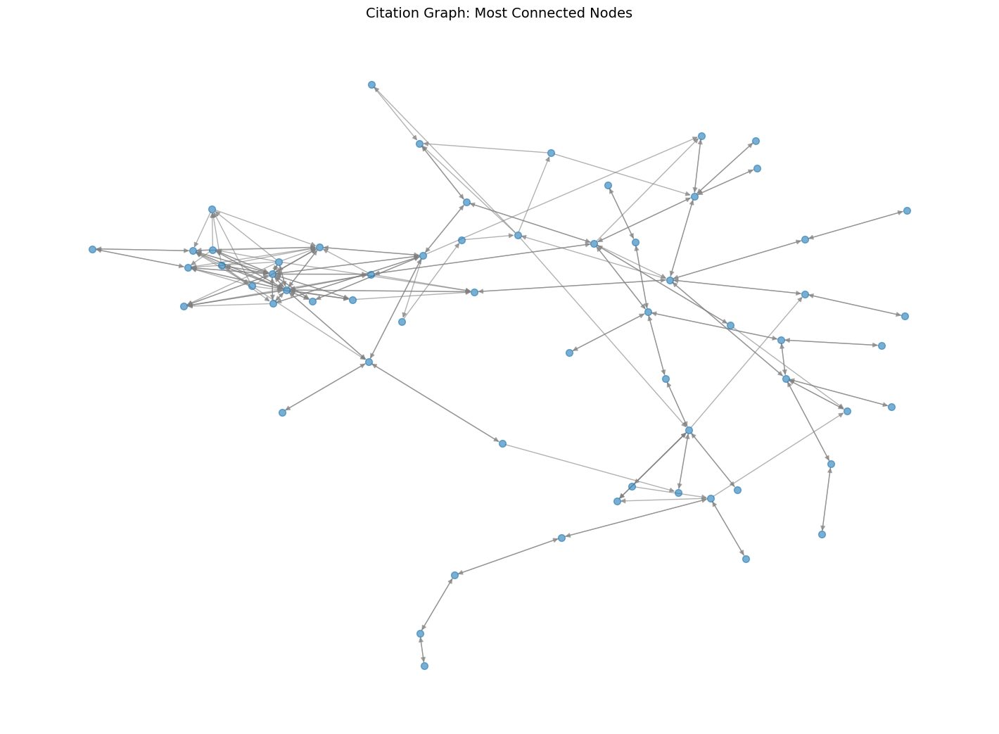

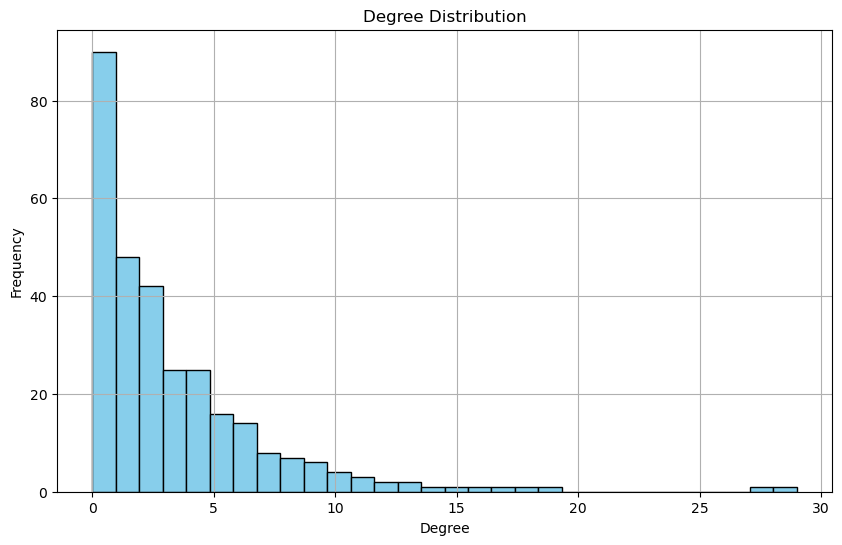

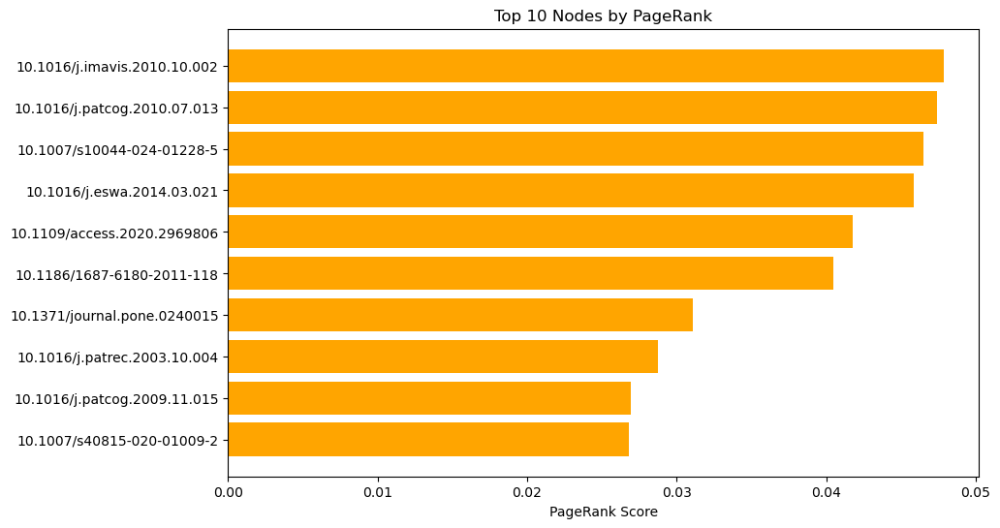

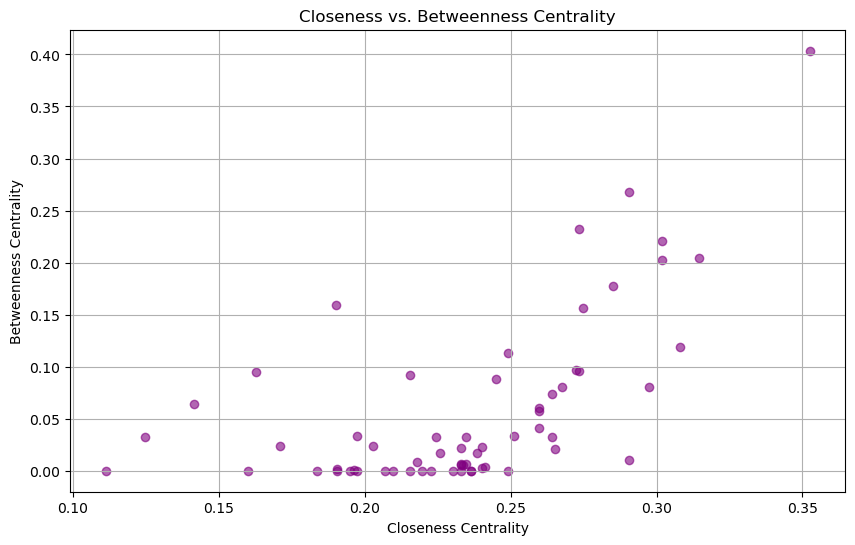

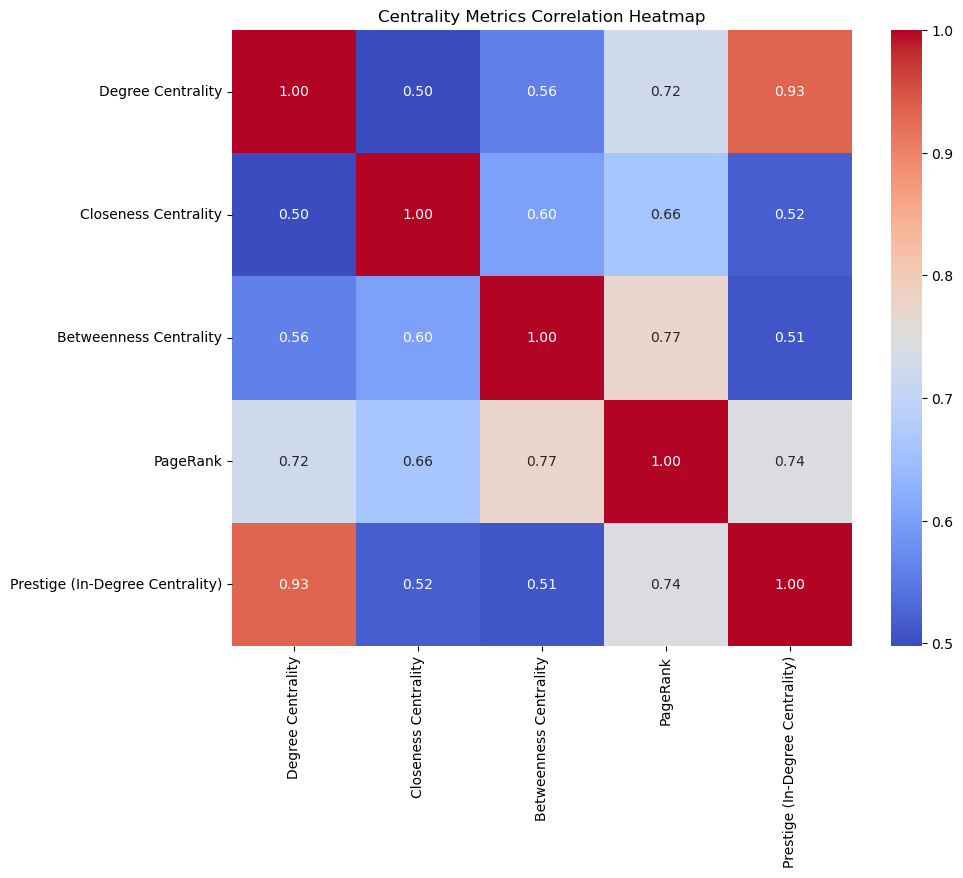

In [31]:
visualize_graph(G_scc)
plot_degree_distribution(G_filtered)
plot_top_pagerank(centralities)
plot_closeness_vs_betweenness(centralities)
plot_centrality_correlation_heatmap(centralities)


In [43]:
# ---------------------------------------------------------------
# In-Degree vs. Out-Degree Scatter Plot
# This plot shows each node based on how many citations it received (in-degree)
# versus how many it made (out-degree). It helps us understand the balance
# between papers that are highly cited vs. those that cite many others,
# revealing citation influencers and survey papers.
# ---------------------------------------------------------------


In [23]:
def plot_in_out_degree(G):
    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())

    nodes = list(G.nodes())
    in_vals = [in_degrees[n] for n in nodes]
    out_vals = [out_degrees[n] for n in nodes]

    plt.figure(figsize=(10, 6))
    plt.scatter(in_vals, out_vals, alpha=0.6, color='teal')
    plt.title("In-Degree vs. Out-Degree")
    plt.xlabel("In-Degree (Citations Received)")
    plt.ylabel("Out-Degree (Citations Made)")
    plt.grid(True)
    plt.show()


In [44]:
# ---------------------------------------------------------------
# Top 10 Nodes by Betweenness Centrality
# Betweenness centrality shows which nodes act as key "bridges" 
# in the network—often connecting clusters. These papers may not be
# the most cited, but they are crucial for the flow of information
# across different research communities.
# ---------------------------------------------------------------


In [24]:
def plot_top_betweenness(centralities):
    bc = centralities["Betweenness Centrality"]
    top_10 = sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]
    labels, values = zip(*top_10)

    plt.figure(figsize=(10, 6))
    plt.barh(labels, values, color='mediumseagreen')
    plt.title("Top 10 Nodes by Betweenness Centrality")
    plt.xlabel("Betweenness Score")
    plt.gca().invert_yaxis()
    plt.show()


In [45]:
# ---------------------------------------------------------------
# Eccentricity Histogram
# Eccentricity measures how far each node is from the most distant
# node in the graph. This histogram helps visualize the distribution
# of "remoteness" in the citation network—papers with low eccentricity
# tend to be more central and accessible.
# ---------------------------------------------------------------


In [25]:
def plot_eccentricity_hist(centralities):
    ecc = centralities.get("Eccentricity", {})
    if ecc:
        values = list(ecc.values())
        plt.figure(figsize=(10, 6))
        plt.hist(values, bins=20, color='coral', edgecolor='black')
        plt.title("Eccentricity Distribution")
        plt.xlabel("Eccentricity")
        plt.ylabel("Frequency")
        plt.grid(True)
        plt.show()
    else:
        print("⚠️ Eccentricity data not available.")


In [46]:
# ---------------------------------------------------------------
# Node Coloring by Eccentricity
# This network graph colors nodes based on eccentricity values,
# visually highlighting the most central vs. peripheral nodes.
# Helps identify hubs and outliers in citation flow.
# ---------------------------------------------------------------


In [26]:
def plot_nodes_by_eccentricity(G, eccentricity_dict):
    if not eccentricity_dict:
        print("⚠️ Cannot plot: eccentricity data missing.")
        return

    ecc_values = list(eccentricity_dict.values())
    vmax = max(ecc_values)
    vmin = min(ecc_values)
    node_colors = [eccentricity_dict[n] for n in G.nodes()]

    pos = nx.spring_layout(G, seed=42)
    plt.figure(figsize=(12, 9))
    nodes = nx.draw_networkx_nodes(
        G, pos, node_color=node_colors, cmap=plt.cm.plasma,
        node_size=100, alpha=0.8
    )
    nx.draw_networkx_edges(G, pos, alpha=0.2)
    plt.colorbar(nodes, label="Eccentricity")
    plt.title("Node Coloring by Eccentricity")
    plt.axis("off")
    plt.show()


In [48]:
# ---------------------------------------------------------------
# Top 10 Nodes by Closeness Centrality
# Closeness centrality measures how close a node is to all others
# in the network. High values suggest papers that are well-positioned
# to quickly spread ideas across the citation graph.
# ---------------------------------------------------------------


In [27]:
def plot_top_closeness(centralities):
    closeness = centralities["Closeness Centrality"]
    top_10 = sorted(closeness.items(), key=lambda x: x[1], reverse=True)[:10]
    labels, values = zip(*top_10)

    plt.figure(figsize=(10, 6))
    plt.barh(labels, values, color="slateblue")
    plt.title("Top 10 Nodes by Closeness Centrality")
    plt.xlabel("Closeness Score")
    plt.gca().invert_yaxis()
    plt.show()


In [49]:
# ---------------------------------------------------------------
# Graph Layout with Node Size Proportional to PageRank
# This visualization sizes each node based on its PageRank score,
# which balances citation quantity and quality. Nodes that are 
# heavily cited by other important nodes appear larger.
# ---------------------------------------------------------------


In [28]:
def plot_graph_by_pagerank(G, pagerank_dict):
    plt.figure(figsize=(14, 10))
    pos = nx.spring_layout(G, seed=42)
    node_sizes = [pagerank_dict.get(n, 0) * 5000 for n in G.nodes()]
    
    nx.draw(
        G, pos,
        with_labels=False,
        node_size=node_sizes,
        node_color='skyblue',
        edge_color='gray',
        alpha=0.6
    )
    plt.title("Graph Layout with Node Size Proportional to PageRank")
    plt.axis("off")
    plt.show()


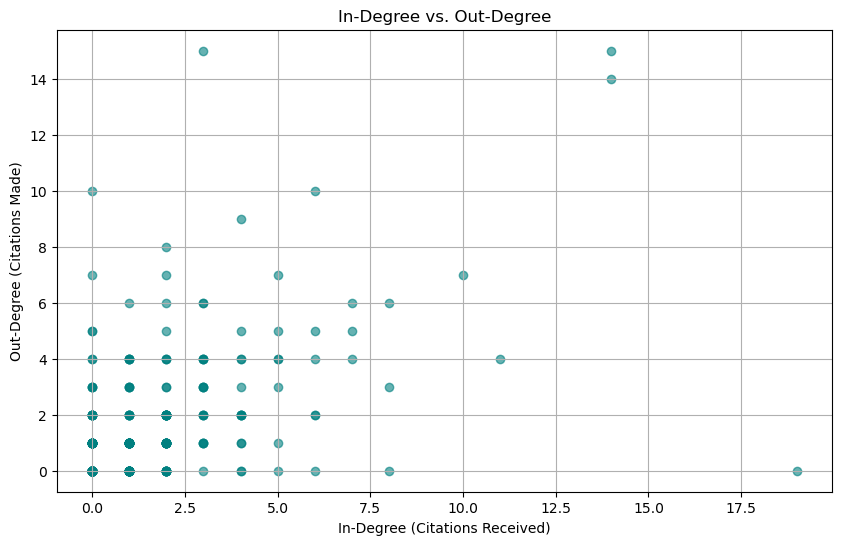

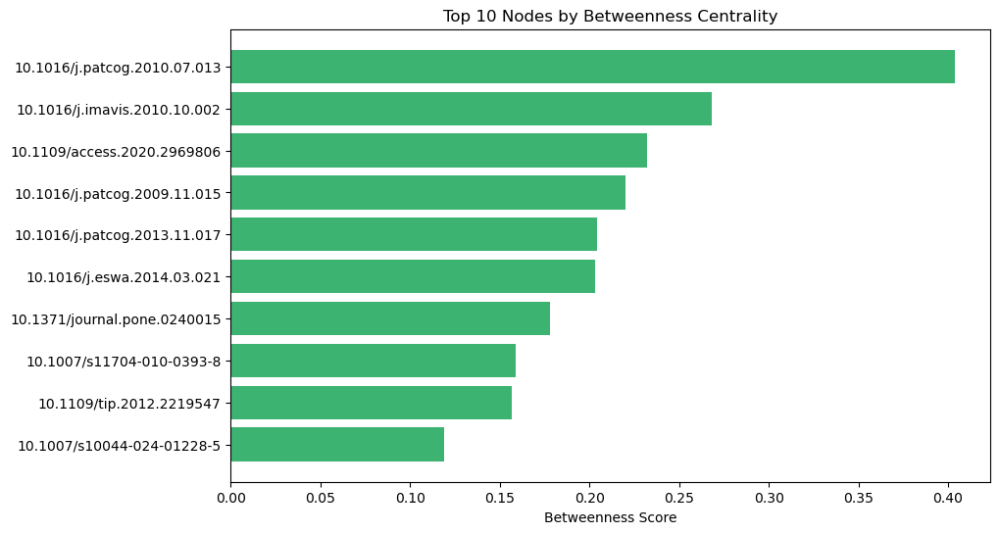

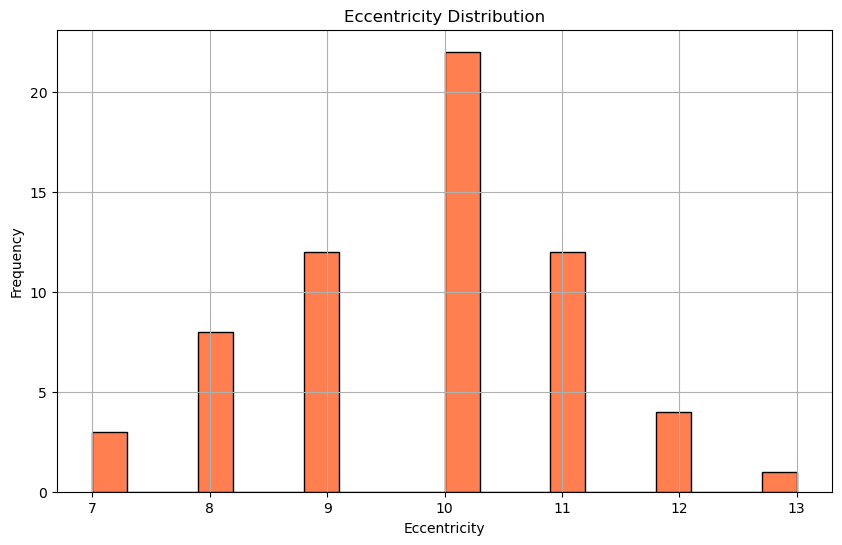

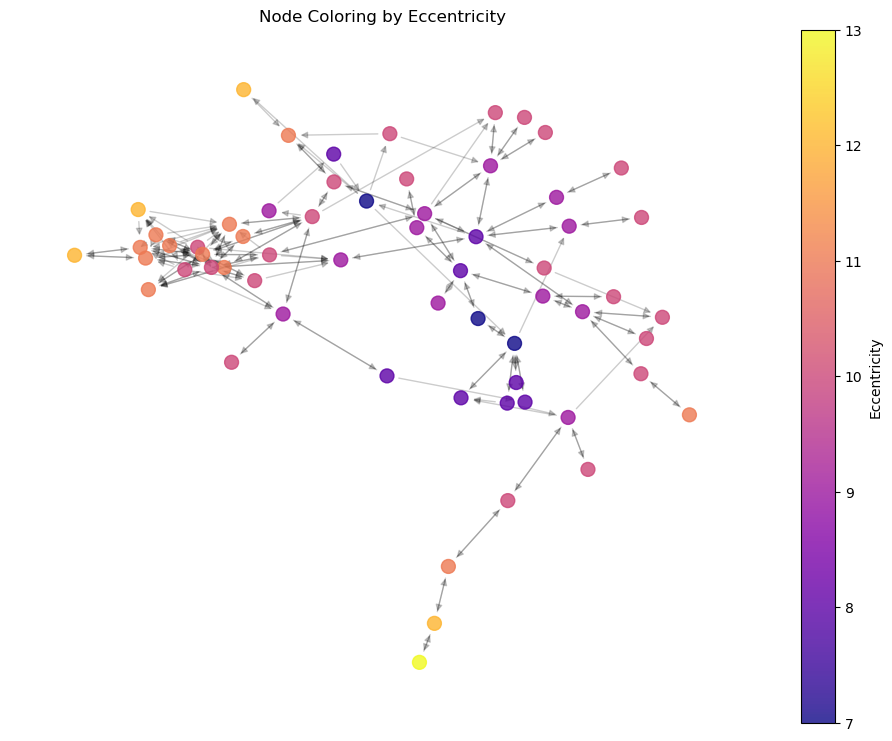

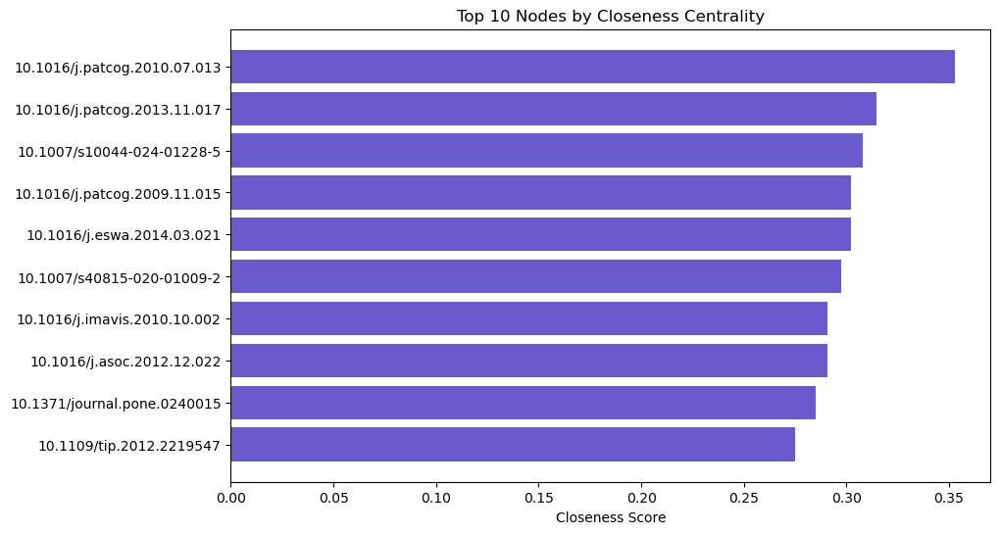

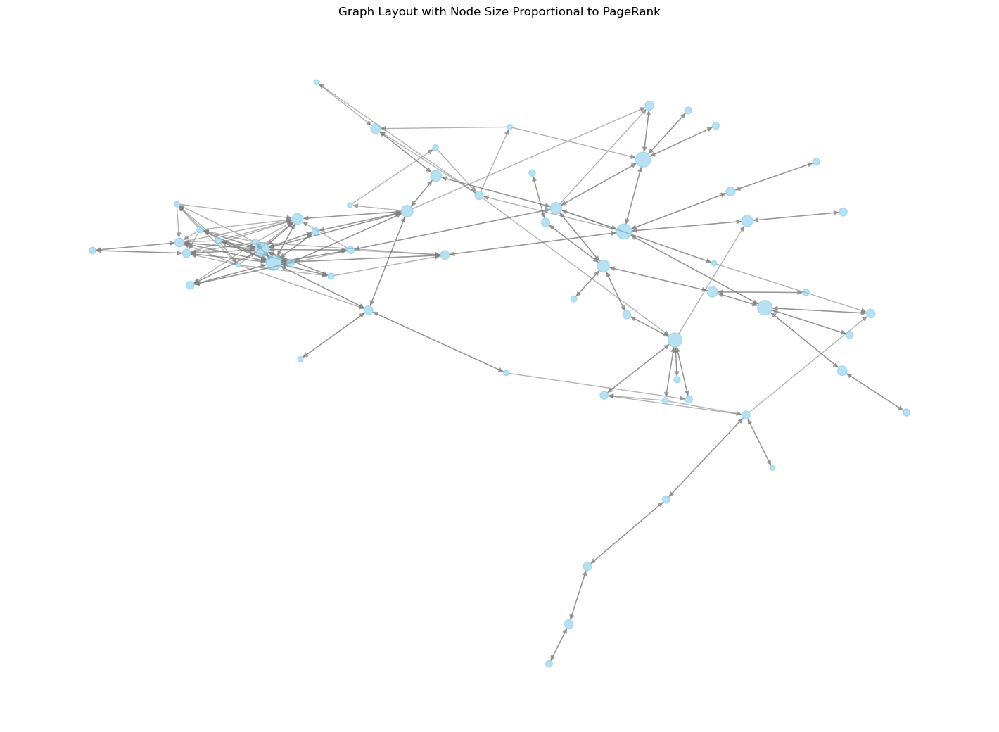

In [29]:
plot_in_out_degree(G_filtered)
plot_top_betweenness(centralities)
plot_eccentricity_hist(centralities)
plot_nodes_by_eccentricity(G_scc, centralities["Eccentricity"])
plot_top_closeness(centralities)
plot_graph_by_pagerank(G_scc, centralities["PageRank"])
